In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [2]:
import sys
sys.version

'3.6.5 |Anaconda, Inc.| (default, Mar 29 2018, 13:32:41) [MSC v.1900 64 bit (AMD64)]'

https://w3.leica-geosystems.com/kb/?guid=5532D590-114C-43CD-A55F-FE79E5937CB2

In [4]:
colsname = ['x', 'y', 'z', 'xn', 'yn', 'zn', 'R', 'G', 'B', 'A', 'quality', 'zz']
lidar = pd.read_csv('../data/20180911_SHCCurb3.ply',
                    delimiter=' ',
                    skiprows=18,
                    #nrows=500000, #use None to read the complete dataset or the number of first rows to read
                    header=None,
                    #error_bad_lines=False,
                    #keep_default_na=False,
                    #dtype={0:'float', 1:'float', 2:'float', 3:'float', 4:'int', 5:'int', 6:'int'},
                    #skipfooter=20, engine='python',
                    #
                    )
lidar.columns=colsname
lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,quality,zz
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,0.193973,NaN
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,0.188113,NaN
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,0.190311,NaN
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,0.195926,NaN
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,0.185672,NaN


In [4]:
lidar.drop(['zz'], inplace=True, axis=1)
lidar.shape

(29183, 11)

In [5]:
lidar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29183 entries, 0 to 29182
Data columns (total 11 columns):
x          29183 non-null float64
y          29183 non-null float64
z          29183 non-null float64
xn         29183 non-null float64
yn         29183 non-null float64
zn         29183 non-null float64
R          29183 non-null int64
G          29183 non-null int64
B          29183 non-null int64
A          29183 non-null int64
quality    29183 non-null float64
dtypes: float64(7), int64(4)
memory usage: 2.4 MB


In [6]:
lidar.describe()

,x,y,z,xn,yn,zn,R,G,B,A,quality
count,29183.000000,29183.000000,29183.000000,29183.000000,29183.000000,29183.000000,29183.000000,29183.000000,29183.000000,29183.0,29183.000000
mean,4.932356,-8.720809,-2.270046,0.036247,0.127371,0.925469,66.976836,74.691019,58.740739,255.0,0.203770
std,0.898344,1.196609,0.076286,0.057298,0.288633,0.198451,47.845634,55.350114,42.502612,0.0,0.051759
min,3.398544,-11.132130,-2.464401,-0.737330,-0.172412,0.016637,1.000000,0.000000,0.000000,255.0,0.126833
25%,4.163605,-9.627823,-2.329056,0.023887,-0.023591,0.989550,27.000000,27.000000,23.000000,255.0,0.180789
50%,4.904037,-8.750076,-2.268173,0.050224,0.000033,0.997379,61.000000,66.000000,53.000000,255.0,0.192508
75%,5.689209,-7.674621,-2.204086,0.063133,0.112833,0.998382,105.000000,120.000000,92.000000,255.0,0.217899
max,6.580704,-6.780930,-2.090378,0.428332,0.999164,1.000000,228.000000,243.000000,207.000000,255.0,0.955459


In [7]:
lidar['hexcolor'] = '#' +  lidar['R'].apply(lambda x:'{0:02x}'.format(x)) + lidar['G'].apply(lambda x:'{0:02x}'.format(x)) + lidar['B'].apply(lambda x:'{0:02x}'.format(x))
            
lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,quality,hexcolor
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,0.193973,#798e68
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,0.188113,#576a4e
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,0.190311,#82936e
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,0.195926,#5c7151
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,0.185672,#728561


In [23]:
# 3d View
#from mpl_toolkits.mplot3d import Axes3D
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
#ax.scatter(xs=lidar.x, ys=lidar.y, zs=lidar.z, c=lidar.hexcolor)
#plt.show()

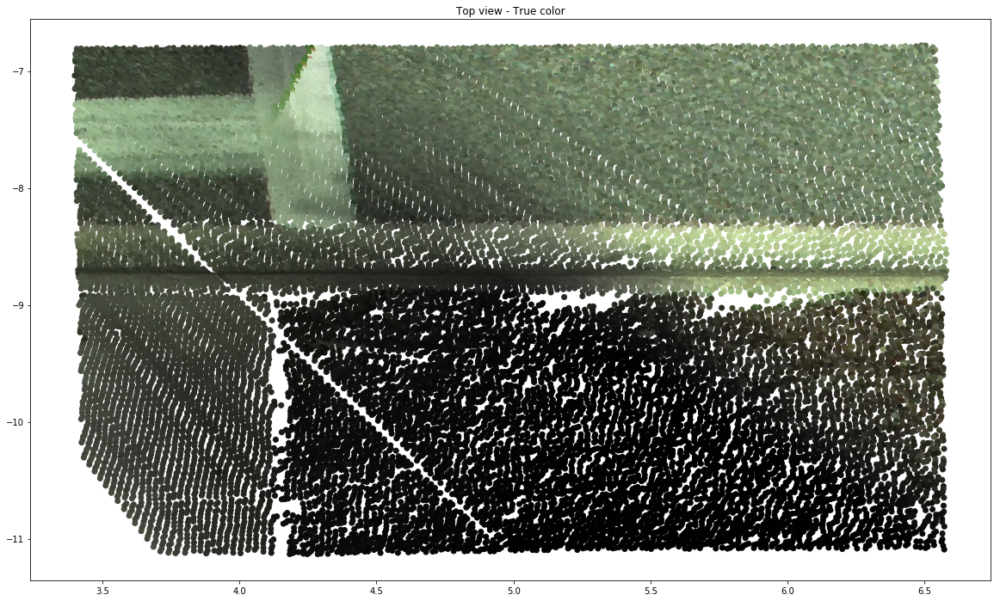

In [9]:
# Top view - true color
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.hexcolor)
plt.title('Top view - True color')
plt.show()

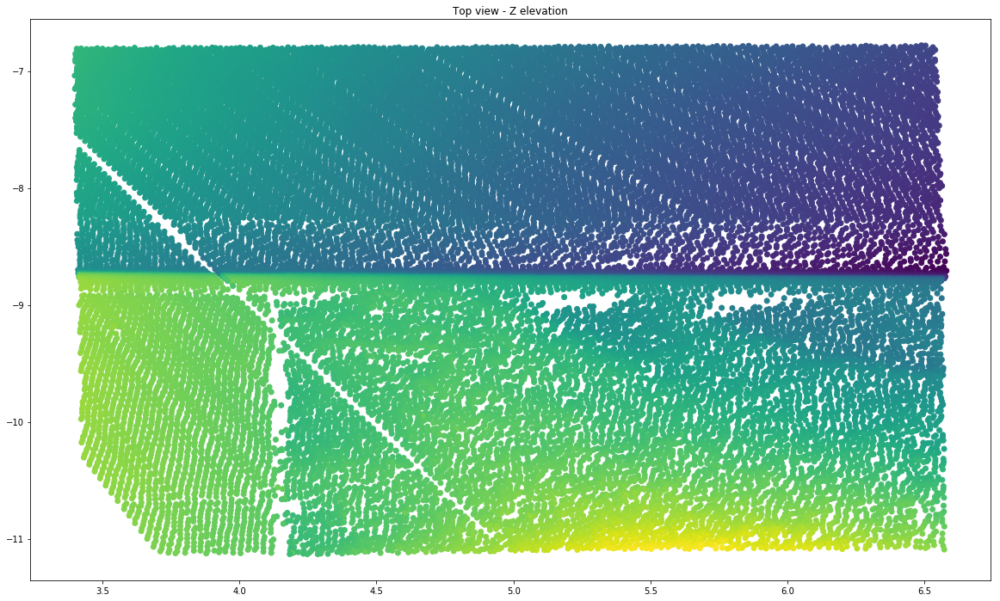

In [10]:
# Top view - Elevation
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.z)
plt.title('Top view - Z elevation')
plt.show()

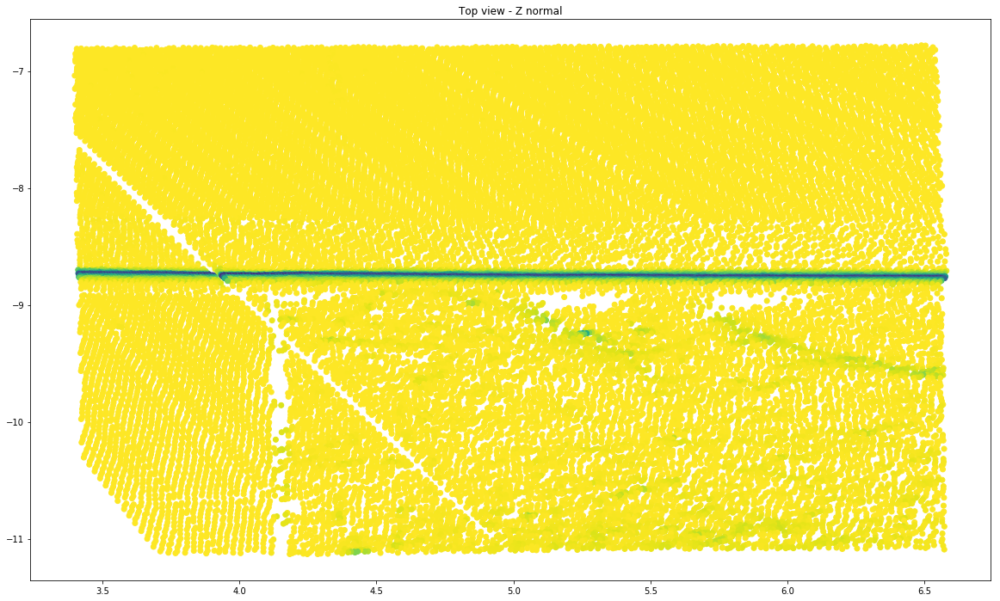

In [72]:
# Top view - Z normal
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.zn)
plt.title('Top view - Z normal')
plt.show()

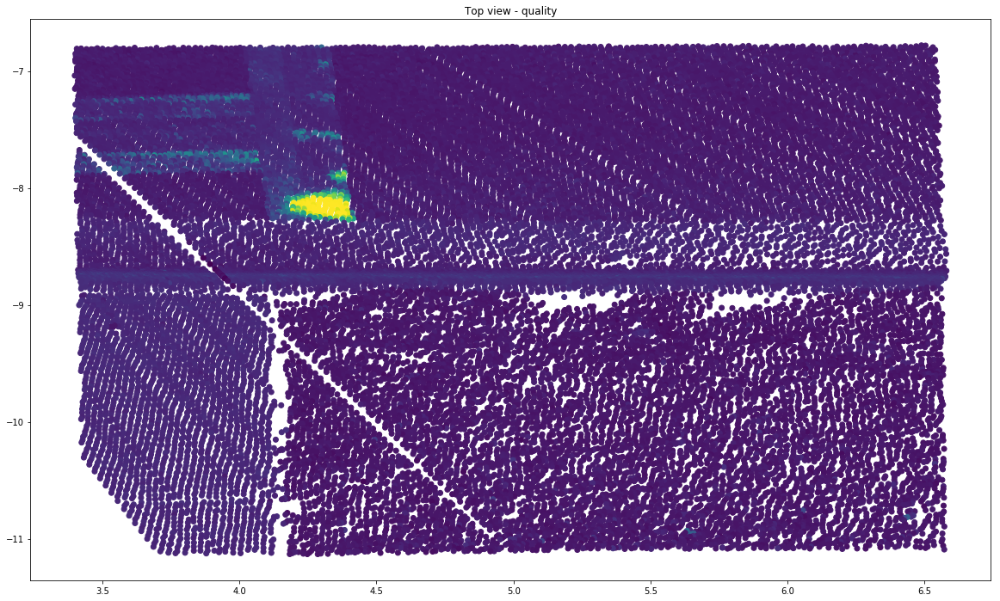

In [12]:
# Top view - Quality
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.quality)
plt.title('Top view - quality')
plt.show()

# nearest deviations

In [16]:
from scipy import spatial

class Spatialagg():
    def __init__(self, dataset, coordinatesnames=['x', 'y', 'z'], radius=.05, p=2):
        self.tree = spatial.KDTree(dataset[coordinatesnames])
        self.dataset = dataset
        self.radius = radius
        self.coordinatesnames = coordinatesnames
        self.p = p
    
    def agg(self, pointcoord, field, feature=np.std):
        df = self.dataset.iloc[self.getiloc(pointcoord)]
        return feature(df[field])
    
    def getiloc(self, pointcoord):
        return self.tree.query_ball_point(pointcoord[self.coordinatesnames], r=self.radius, p=self.p)

spatialagg = Spatialagg(lidar,)

In [17]:
%%time
lidar['xnsd'] = lidar.apply(spatialagg.agg, axis=1, args=('xn', ))
print('xn done !')
lidar['ynsd'] = lidar.apply(spatialagg.agg, axis=1, args=('yn', ))
print('yn done !')
lidar['znsd'] = lidar.apply(spatialagg.agg, axis=1, args=('zn', ))
print('zn done !')

xn done !
yn done !
zn done !
Wall time: 7min 21s


In [25]:
lidar['xynsd'] = np.sqrt(lidar['xnsd']**2 + lidar['ynsd']**2)

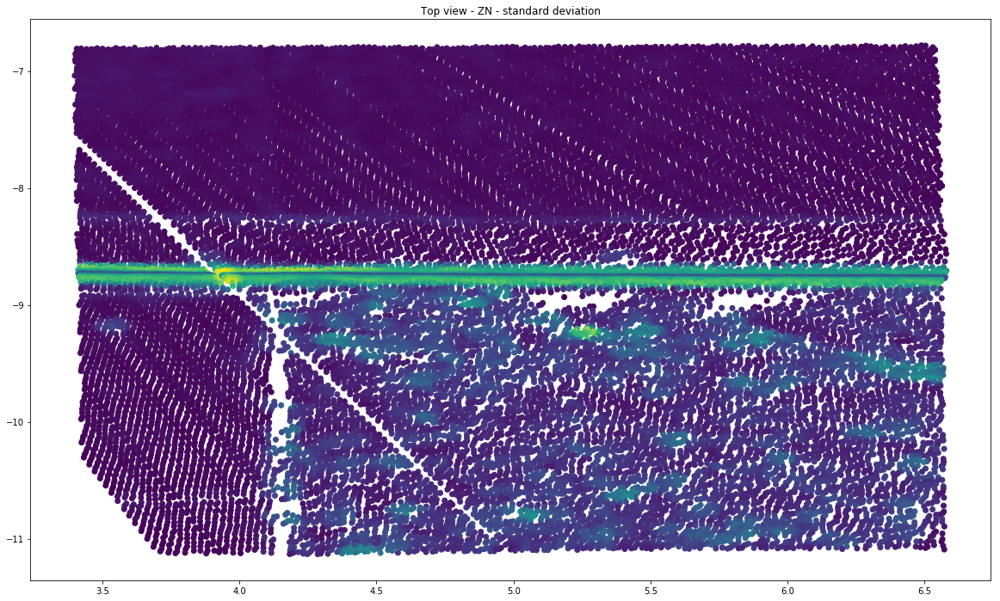

In [26]:
# Top view - XYN SD
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.xynsd)
plt.title('Top view - ZN - standard deviation')
plt.show()

# Points density calculation

In [27]:
# Dataset surface
surface = np.abs(lidar.x.max() - lidar.x.min()) * np.abs(lidar.y.max() - lidar.y.min())
print(surface, 'm2')

13.846214591999994 m2


In [28]:
# Density calculation
lidar.shape[0] / surface

2107.6518644208527

# Color clustering

In [29]:
dataset = lidar[['R', 'G', 'B']]
dataset.shape

(29183, 3)

In [30]:
# Scaling and centering
from sklearn.preprocessing import StandardScaler
colscaler = StandardScaler()
Xs = colscaler.fit_transform(dataset)
Xs.shape

(29183, 3)

In [31]:
from sklearn.cluster import KMeans
colkmeans = KMeans(n_clusters=5, random_state=0)
colkmeans.fit(Xs)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [32]:
lidar['clust_color'] = colkmeans.predict(Xs)
lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,quality,hexcolor,xnsd,ynsd,znsd,xynsd,clust_color
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,0.193973,#798e68,0.005411,0.005516,0.000169,0.007726,0
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,0.188113,#576a4e,0.009011,0.008210,0.000344,0.012190,0
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,0.190311,#82936e,0.005665,0.007522,0.000186,0.009417,0
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,0.195926,#5c7151,0.008753,0.008394,0.000325,0.012128,0
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,0.185672,#728561,0.008468,0.007044,0.000347,0.011015,0


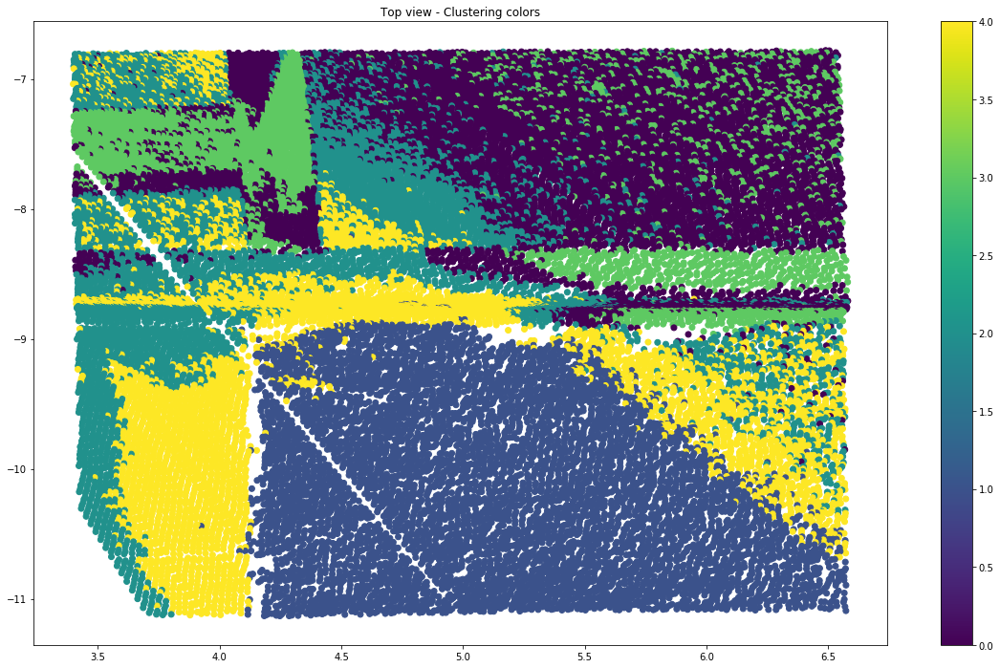

In [33]:
# Top view - true color
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.clust_color)
plt.title('Top view - Clustering colors')
plt.colorbar()
plt.show()

# KNN normals

In [34]:
dataset = lidar[['x', 'y', 'z']]

In [35]:
# Scaling and centering
from sklearn.preprocessing import StandardScaler
coordscaler = StandardScaler()
coordsc = coordscaler.fit_transform(dataset)
coordsc.shape

(29183, 3)

In [36]:
from sklearn.neighbors import KNeighborsRegressor

knnparams = {#'weights':'distance', #'uniform is default and gives better result'
             'n_neighbors':20, 
             'p':2 #Defines how the result is calculated, 1=Manhattan, 2=Euclidian
            }

Xknn = KNeighborsRegressor(**knnparams)
Yknn = KNeighborsRegressor(**knnparams)
Zknn = KNeighborsRegressor(**knnparams)

Xknn.fit(coordsc, lidar['xn'].values)
lidar['xn_knn'] = Xknn.predict(coordsc)
Yknn.fit(coordsc, lidar['yn'].values)
lidar['yn_knn'] = Yknn.predict(coordsc)
Zknn.fit(coordsc, lidar['zn'].values)
lidar['zn_knn'] = Zknn.predict(coordsc)

lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,quality,hexcolor,xnsd,ynsd,znsd,xynsd,clust_color,xn_knn,yn_knn,zn_knn
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,0.193973,#798e68,0.005411,0.005516,0.000169,0.007726,0,0.053739,-0.027539,0.998123
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,0.188113,#576a4e,0.009011,0.008210,0.000344,0.012190,0,0.052303,-0.027756,0.998193
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,0.190311,#82936e,0.005665,0.007522,0.000186,0.009417,0,0.053200,-0.030650,0.998062
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,0.195926,#5c7151,0.008753,0.008394,0.000325,0.012128,0,0.051649,-0.027382,0.998238
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,0.185672,#728561,0.008468,0.007044,0.000347,0.011015,0,0.053794,-0.029047,0.998077


C:\Users\student\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\student\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


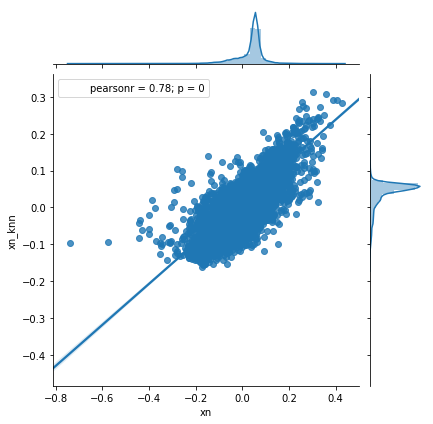

In [37]:
#result variation
import seaborn as sns
sns.jointplot(x="xn", y="xn_knn", data=lidar, kind='reg')
plt.show()

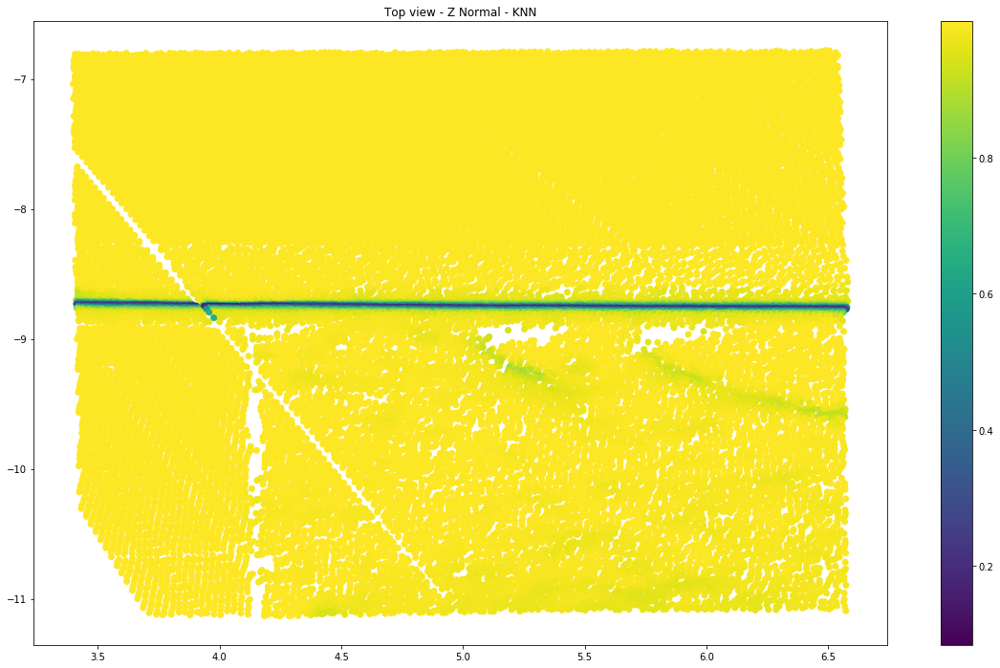

In [38]:
# Top view - Z Normal - KNN
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.zn_knn)
plt.title('Top view - Z Normal - KNN')
plt.colorbar()
plt.show()

# Elevation correction

In [39]:
# Slope calculation
dataset = lidar[lidar['y']>-7]
offset = (dataset.z.max() - dataset.z.min())
offset

0.17364500000000005

In [40]:
# dataset slope
np.degrees(np.arctan(offset/np.abs((dataset.x.max() - dataset.x.min()))))

3.166039955555752

In [41]:
from sklearn.linear_model import LinearRegression
slopereg = LinearRegression()
slopereg.fit(X=dataset.x.values.reshape(-1,1), y=dataset.z.values.reshape(-1,1))

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [42]:
lidar['z_corr'] = lidar.z - slopereg.predict(lidar.x.values.reshape(-1,1)).reshape(-1)

In [43]:
dataset = lidar[lidar['y']>-7]
dataset.z_corr.max() - dataset.z_corr.min()

0.01447531776494504

C:\Users\student\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\student\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


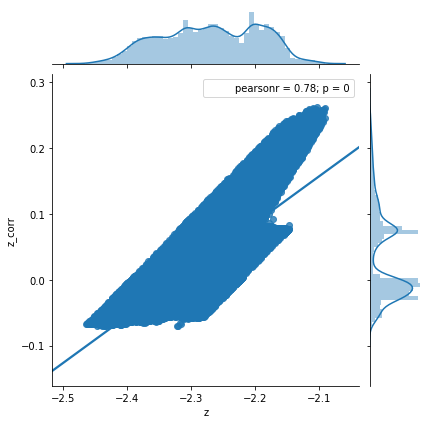

In [44]:
#result variation
import seaborn as sns
sns.jointplot(x="z", y="z_corr", data=lidar, kind='reg')
plt.show()

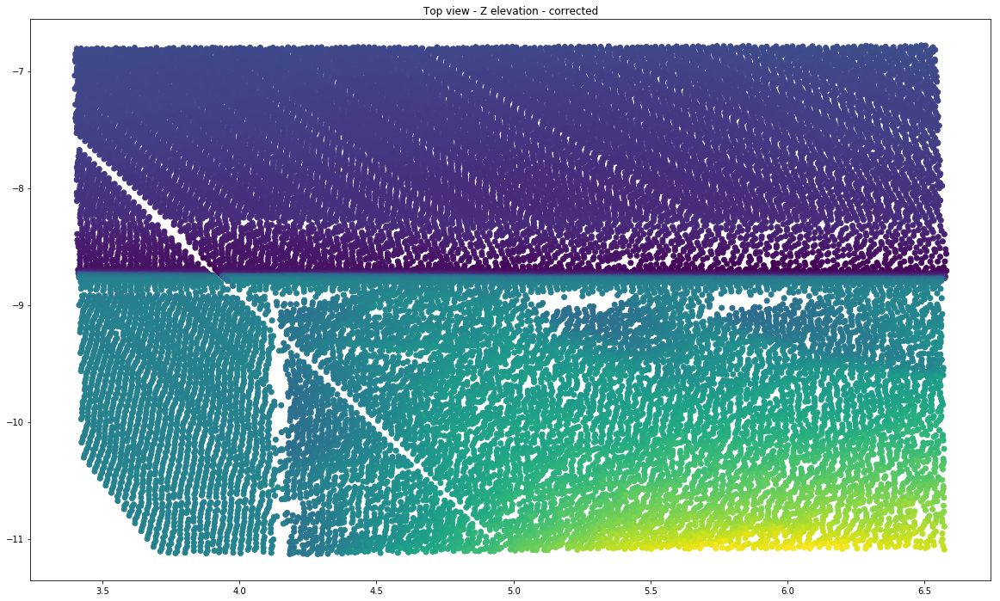

In [45]:
# Top view - Elevation corrected
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=lidar.z_corr)
plt.title('Top view - Z elevation - corrected')
plt.show()

# Kmeans Sidewalk

In [46]:
lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,...,hexcolor,xnsd,ynsd,znsd,xynsd,clust_color,xn_knn,yn_knn,zn_knn,z_corr
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,...,#798e68,0.005411,0.005516,0.000169,0.007726,0,0.053739,-0.027539,0.998123,0.007710
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,...,#576a4e,0.009011,0.008210,0.000344,0.012190,0,0.052303,-0.027756,0.998193,0.007312
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,...,#82936e,0.005665,0.007522,0.000186,0.009417,0,0.053200,-0.030650,0.998062,0.006361
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,...,#5c7151,0.008753,0.008394,0.000325,0.012128,0,0.051649,-0.027382,0.998238,0.006155
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,...,#728561,0.008468,0.007044,0.000347,0.011015,0,0.053794,-0.029047,0.998077,0.005702


In [62]:
kmeanscol = []

# XY coordinate
kmeanscol.extend(['x', 'y'])

# Elevation
#kmeanscol.append('z')

# Corrected Elevation
kmeanscol.append('z_corr')

# Standard deviation
kmeanscol.extend(['xnsd', 'ynsd', 'znsd'])
kmeanscol.append('xynsd')

# quality
#kmeanscol.append('quality')

# All the colors
kmeanscol.extend(['R', 'G', 'B'])

# Color cluster
kmeanscol.extend(['clust_color'])

# Normals coordinate
kmeanscol.extend(['xn', 'yn', 'zn'])

# Normals coordinate
#kmeanscol.extend(['xn_knn', 'yn_knn', 'zn_knn'])



dataset = lidar[kmeanscol]
dataset.head()

,z_corr,xnsd,ynsd,znsd,xynsd,R,G,B,clust_color,xn,yn,zn
0,0.007710,0.005411,0.005516,0.000169,0.007726,121,142,104,0,0.035693,-0.037846,0.998646
1,0.007312,0.009011,0.008210,0.000344,0.012190,87,106,78,0,0.044266,-0.033033,0.998474
2,0.006361,0.005665,0.007522,0.000186,0.009417,130,147,110,0,0.050499,-0.032237,0.998204
3,0.006155,0.008753,0.008394,0.000325,0.012128,92,113,81,0,0.051617,-0.021600,0.998433
4,0.005702,0.008468,0.007044,0.000347,0.011015,114,133,97,0,0.046914,-0.039101,0.998133


In [63]:
# Scaling and centering
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
Xs = scaler.fit_transform(dataset)
Xs.shape

(29183, 12)

In [64]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(random_state=0)
Xpca = pca.fit_transform(Xs)

In [69]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0)
kmeans.fit(Xpca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

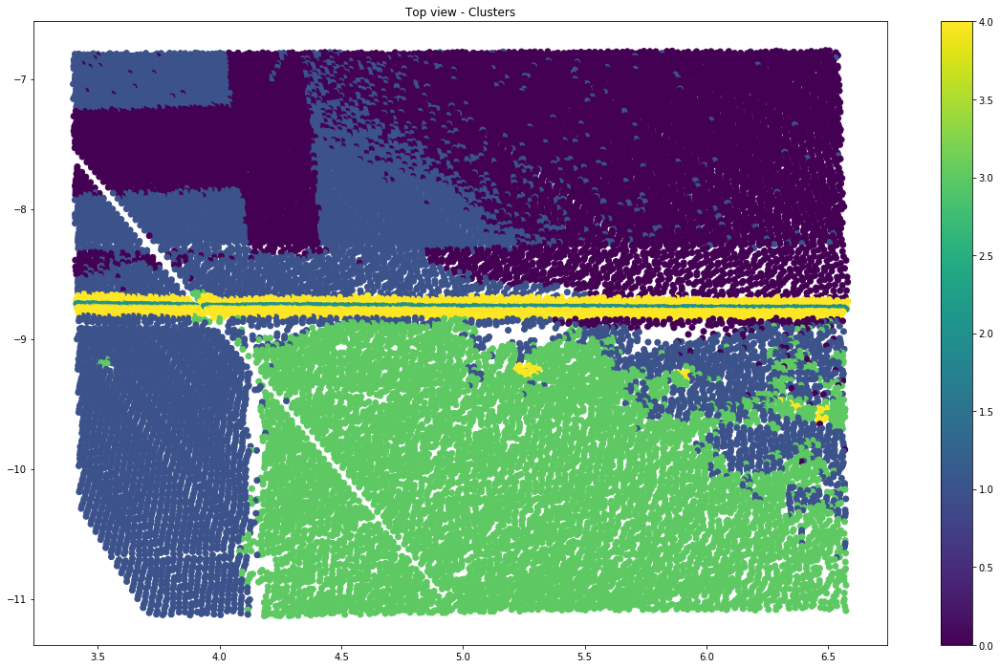

In [70]:
labels = kmeans.predict(Xpca)
# Top view - clusters
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=labels)
plt.title('Top view - Clusters')
plt.colorbar()
plt.show()

In [37]:
lidar['label'] = kmeans.predict(Xpca).reshape(-1)
lidar.head()

,x,y,z,xn,yn,zn,R,G,B,A,quality,hexcolor,clust_color,xn_knn,yn_knn,zn_knn,z_corr,label
0,6.531357,-6.797287,-2.386337,0.035693,-0.037846,0.998646,121,142,104,255,0.193973,#798e68,0,0.053739,-0.027539,0.998123,0.007710,1
1,6.504440,-6.783005,-2.385269,0.044266,-0.033033,0.998474,87,106,78,255,0.188113,#576a4e,0,0.052303,-0.027756,0.998193,0.007312,1
2,6.539658,-6.819748,-2.388138,0.050499,-0.032237,0.998204,130,147,110,255,0.190311,#82936e,0,0.053200,-0.030650,0.998062,0.006361,1
3,6.489365,-6.780930,-2.385605,0.051617,-0.021600,0.998433,92,113,81,255,0.195926,#5c7151,0,0.051649,-0.027382,0.998238,0.006155,1
4,6.523087,-6.816177,-2.387894,0.046914,-0.039101,0.998133,114,133,97,255,0.185672,#728561,0,0.053794,-0.029047,0.998077,0.005702,1


# Sidewalk regression

In [38]:
sidewalklabel = 2

In [39]:
dataset = lidar[lidar['label'] == sidewalklabel]
dataset.shape

(3158, 18)

In [40]:
from sklearn.linear_model import LinearRegression
sidewalkreg = LinearRegression()
sidewalkreg.fit(X=dataset.x.values.reshape(-1,1), y=dataset.y.values.reshape(-1,1))

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [41]:
sidewalkreg.coef_, sidewalkreg.intercept_

(array([[-0.00972296]]), array([-8.71200183]))

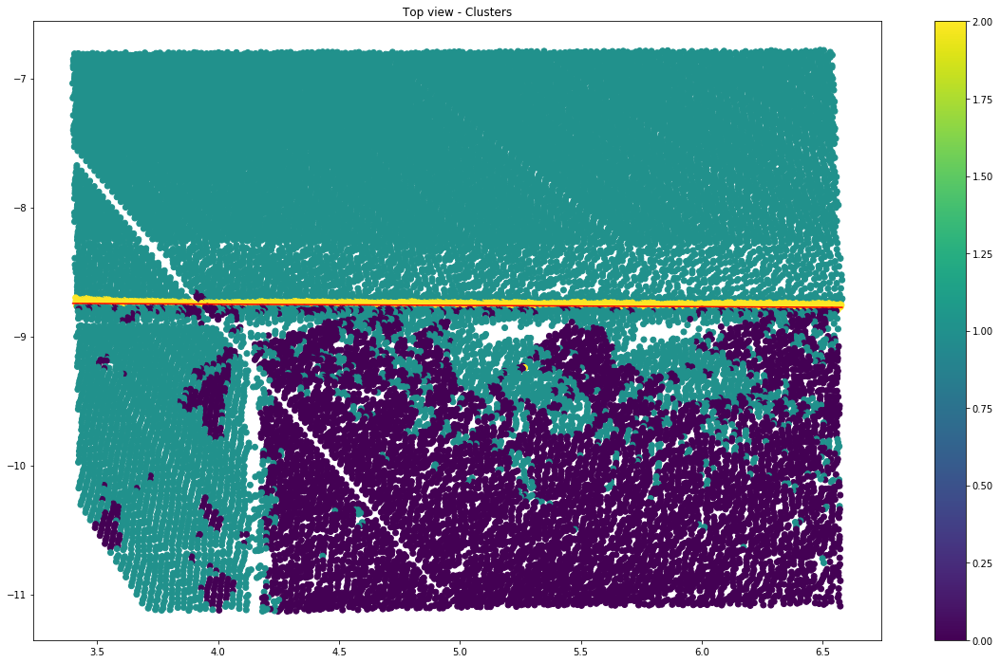

In [42]:
labels = kmeans.predict(Xpca)
# Top view - clusters
fig = plt.figure(figsize=(20,12))
plt.scatter(x=lidar.x, y=lidar.y, c=labels)
plt.title('Top view - Clusters')
plt.colorbar()

plt.plot([lidar.x.min(), lidar.x.max()], sidewalkreg.predict(np.array([lidar.x.min(), lidar.x.max()]).reshape(-1,1)).reshape(-1), 'k-', color = 'r')

plt.show()

# Beyond the sidewalk...

In [43]:
grass = lidar[lidar['y'] < sidewalkreg.intercept_[0]-.2]
grass.shape

(11332, 18)

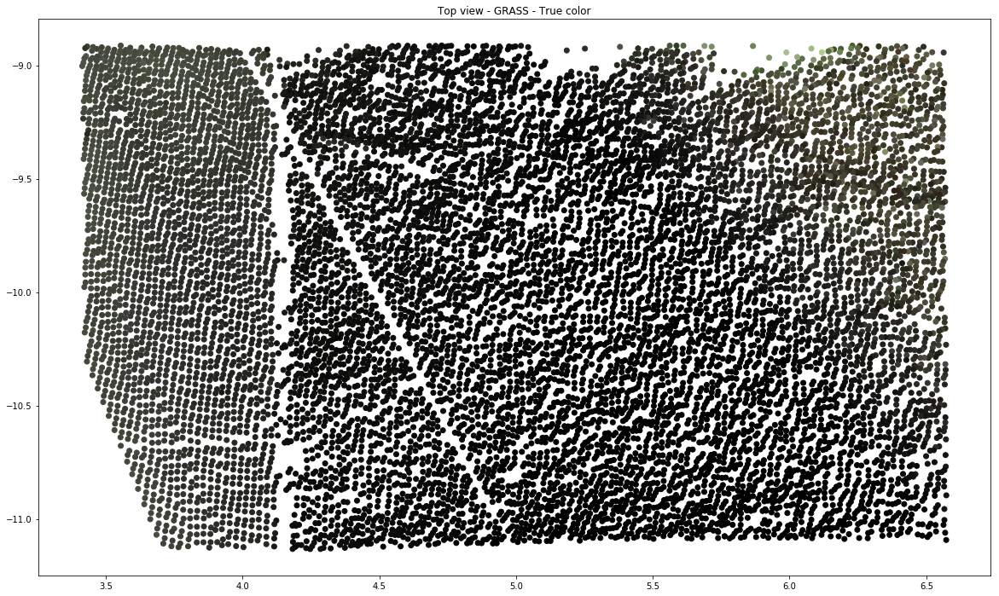

In [44]:
# Top view - true color
fig = plt.figure(figsize=(20,12))
plt.scatter(x=grass.x, y=grass.y, c=grass.hexcolor)
plt.title('Top view - GRASS - True color')
plt.show()

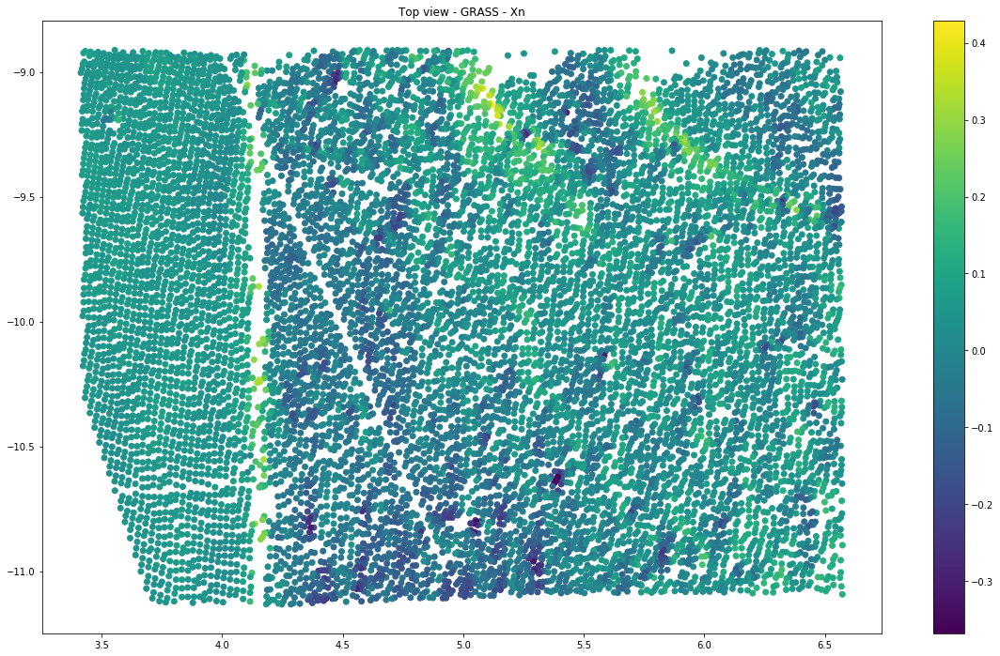

In [45]:
# Top view - true color
fig = plt.figure(figsize=(20,12))
plt.scatter(x=grass.x, y=grass.y, c=grass.xn)
plt.title('Top view - GRASS - Xn')
plt.colorbar()
plt.show()

In [46]:
kmeanscol = []

# XY coordinate
kmeanscol.extend(['x', 'y'])

# Elevation
#kmeanscol.append('z')

# Corrected Elevation
kmeanscol.append('z_corr')

# quality
#kmeanscol.append('quality')

# All the colors
#kmeanscol.extend(['R', 'G', 'B'])

# Color cluster
#kmeanscol.extend(['clust_color'])

# Normals coordinate
kmeanscol.extend(['xn', 'yn', 'zn'])

# Normals coordinate
#kmeanscol.extend(['xn_knn', 'yn_knn', 'zn_knn'])



dataset = grass[kmeanscol]
dataset.head()

,x,y,z_corr,xn,yn,zn
3564,6.563400,-8.943130,0.077112,0.087338,-0.034780,0.995571
3751,6.521439,-8.941666,0.083128,0.073838,-0.053787,0.995819
3813,6.489761,-8.917618,0.082775,-0.027484,-0.008441,0.999587
3814,6.546951,-8.996201,0.077132,0.052376,-0.020532,0.998416
3877,6.500504,-8.951920,0.081774,-0.001102,-0.062487,0.998045


In [47]:
# Scaling and centering
from sklearn.preprocessing import StandardScaler
grassscaler = StandardScaler()
Xs = grassscaler.fit_transform(dataset)
Xs.shape


# PCA
from sklearn.decomposition import PCA
grasspca = PCA(random_state=0)
Xpca = grasspca.fit_transform(Xs)


# Kmeans
from sklearn.cluster import KMeans
grasskmeans = KMeans(n_clusters=2, random_state=0)
grasskmeans.fit(Xpca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

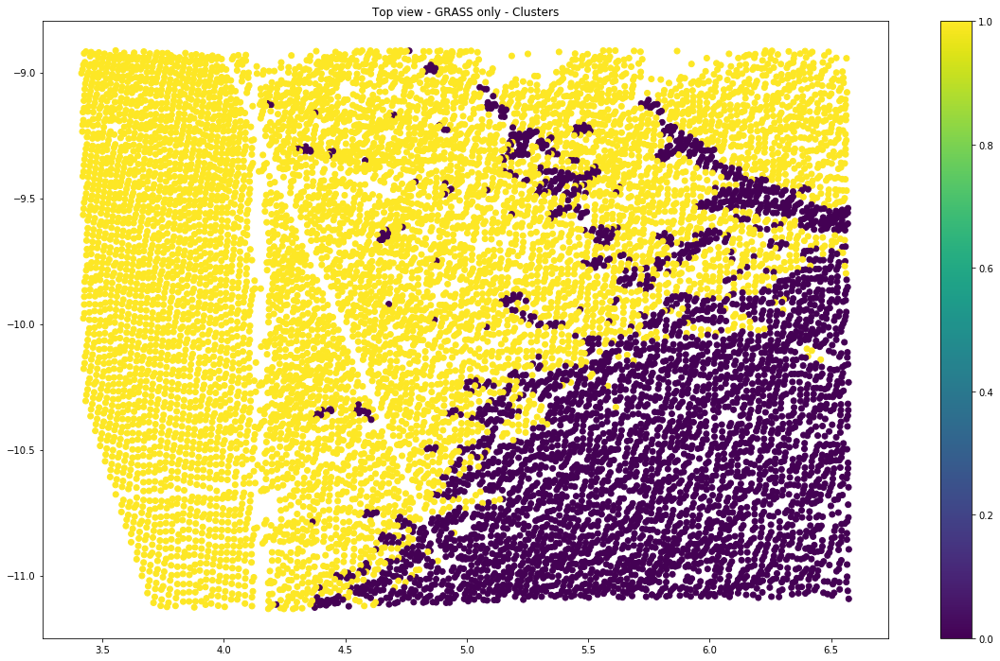

In [48]:
labels = grasskmeans.predict(Xpca)
# Top view - clusters
fig = plt.figure(figsize=(20,12))
plt.scatter(x=grass.x, y=grass.y, c=labels)
plt.title('Top view - GRASS only - Clusters')
plt.colorbar()
plt.show()

In [49]:
from sklearn.neighbors import LocalOutlierFactor

Xlof = LocalOutlierFactor(n_neighbors=300)
Xlof.fit(grass[['xn', 'yn', 'zn']])

LocalOutlierFactor(algorithm='auto', contamination=0.1, leaf_size=30,
          metric='minkowski', metric_params=None, n_jobs=1,
          n_neighbors=300, p=2)

In [50]:
grass['LOF'] = Xlof.fit_predict(grass[['xn', 'yn', 'zn']]).reshape(-1)
grass.head()

C:\Users\student\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,x,y,z,xn,yn,zn,R,G,B,A,quality,hexcolor,clust_color,xn_knn,yn_knn,zn_knn,z_corr,label,LOF
3564,6.563400,-8.943130,-2.318680,0.087338,-0.034780,0.995571,56,52,43,255,0.174441,#38342b,4,0.066018,0.074528,0.987485,0.077112,1,-1
3751,6.521439,-8.941666,-2.310379,0.073838,-0.053787,0.995819,84,77,59,255,0.177615,#544d3b,2,0.031859,0.025295,0.996404,0.083128,1,-1
3813,6.489761,-8.917618,-2.309006,-0.027484,-0.008441,0.999587,43,48,44,255,0.191287,#2b302c,4,0.017581,0.038422,0.995649,0.082775,0,1
3814,6.546951,-8.996201,-2.317764,0.052376,-0.020532,0.998416,99,99,71,255,0.165896,#636347,2,0.060925,0.025969,0.995615,0.077132,1,-1
3877,6.500504,-8.951920,-2.310593,-0.001102,-0.062487,0.998045,94,89,67,255,0.180789,#5e5943,2,0.035336,0.026569,0.996361,0.081774,0,-1


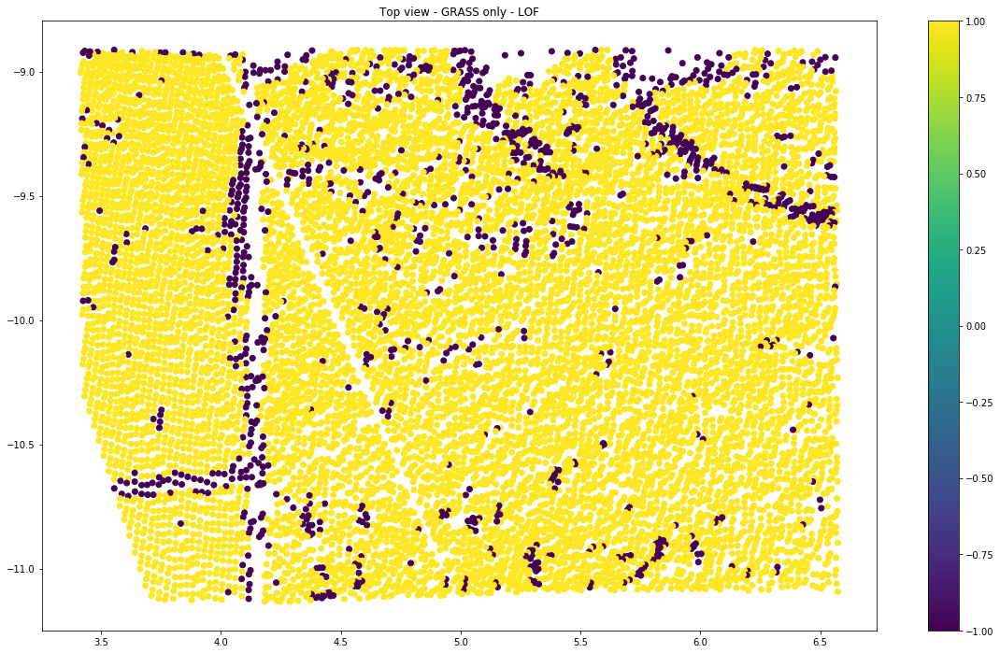

In [51]:

# Top view - LOF
fig = plt.figure(figsize=(20,12))
plt.scatter(x=grass.x, y=grass.y, c=grass.LOF)
plt.title('Top view - GRASS only - LOF')
plt.colorbar()
plt.show()

https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.KDTree.html#scipy.spatial.KDTree